In [1]:
# Spyder Editor

# **Análisis de Movimiento Zebrafish**
### Author: Alejandro Campoy Lopez  

In [2]:
import pandas as pd
import re
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import find_peaks, find_peaks_cwt, detrend, periodogram, lombscargle
from scipy.fft import fft, rfft, fftfreq, rfftfreq
from scipy.linalg import dft

os.chdir("/home/ale/Documentos/GitHub/Cebrafish_videos/Experiment 1 - Contractions")
from functions_aux_analysis import *

plt.rcParams["figure.figsize"] = (15, 8)

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Lectura de Archivos
Lectura de todos los archivos csv con los resultados de los diferentes batches.
Se añade una columna representando el gusano y el batch mediante el uso de regex

In [3]:

windows = False
if windows:
    folder_path = "p:\\CABD\\Lab Ozren\\Marta Fernandez\\Experimento Coletazos\\"
else:
    folder_path = (
        "/home/ale/pCloudDrive/CABD/Lab Ozren/Marta Fernandez/Experimento Coletazos/"
    )
files = get_files_in_folder(folder_path)

df = []
for f in files:
    if ".csv" in f:
        csv = pd.read_csv(f, sep=";").drop(
            [
                "FeretAngle",
                "NBranches",
                "AvgBranchLen",
                "MaxBranchLen",
                "BranchLen",
                "EuclideanDist",
                "AR",  # this is the inverse of Roundness
            ],
            axis=1,
        )
        csv.insert(0, "Batch", re.search("Batch \d+", f).group(0))
        csv.insert(1, "Fenotype", re.search("KO\d*|WT", f.upper()).group(0))
        csv.insert(2, "Fish", "ZebraF_" + re.search("(\d+)(.lif)", f).group(1))
        df.append(csv)
        del (csv, f)

df = pd.concat(df)
# renombro la columna con nombre repetido
df = df.rename(columns={"XM.1": "YM"})

# renombro KO a KO44 para el batch 6 y 7
df.loc[df.Fenotype == "KO", "Fenotype"] = "KO44"



## Número de NAs por ZebraF
Visualizamos el número de Frames no segmentados apropiadamente por pez. Dado que no son demasiados, los imputo mediante interpolación Lineal.

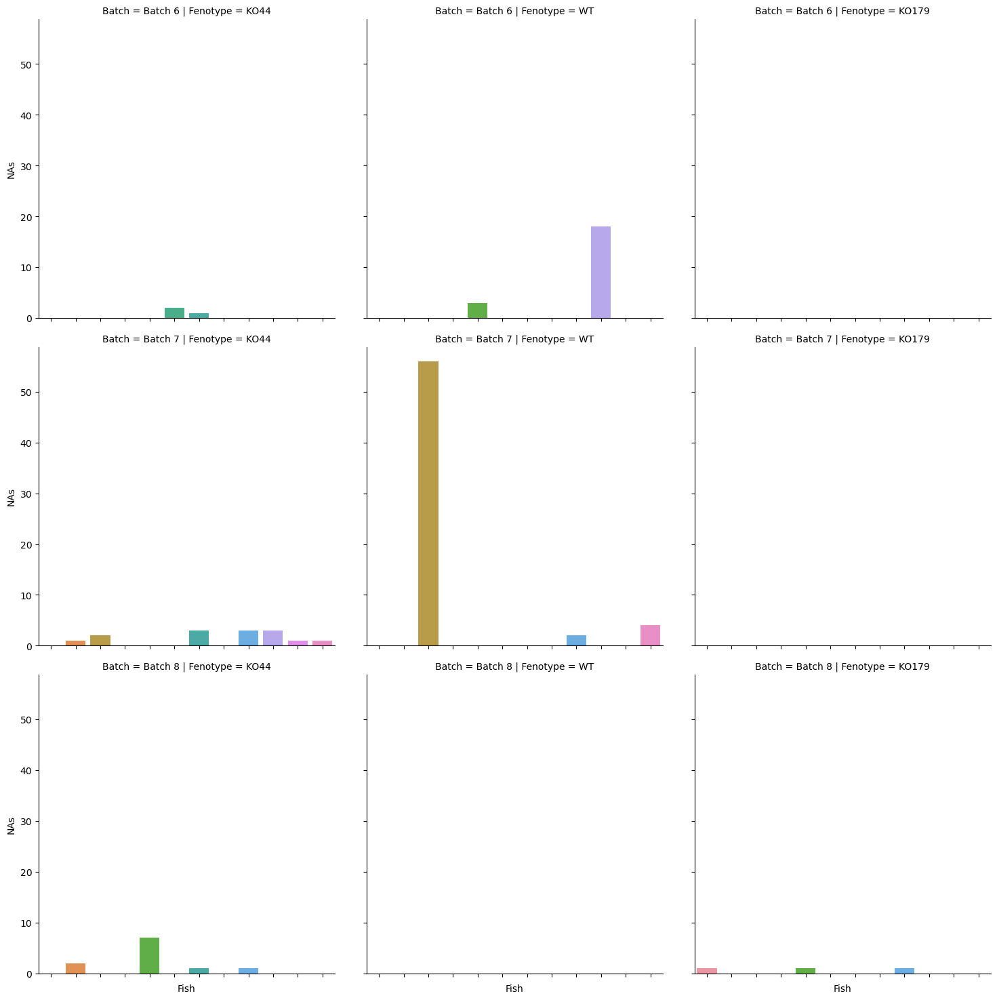

In [4]:
NAs = (
    df.groupby(["Batch", "Fenotype", "Fish"])
    .apply(lambda x: x.isnull().sum())[["area"]]
    .rename(columns={"area": "NAs"})
).reset_index()  # me quedo solo con una columna ya que el numero de NAN es el mismo en todas

NAs["Batch_Feno"] = NAs.Batch + "_" + NAs.Fenotype
# NAs_barplot = sns.barplot(x="Fish", y="NAs", hue="Batch", data=NAs.reset_index())
# plt.xticks(rotation=90)
# plt.show()

NAs_barplot = sns.catplot(
    kind="bar", data=NAs.reset_index(), x="Fish", y="NAs", col="Fenotype", row="Batch"
)
NAs_barplot.set_xticklabels(rotation=90)
plt.show()

In [5]:

df = df.interpolate(method="linear")

El Zebra 10 WT del batch 7 se ha eliminado por contener > 500 NAs

## Distancia Recorrida
Se calcula la distancia que recorre el pez a lo largo del video y se gráfica por batch

In [6]:

df.insert(7, "X_diff", df.groupby(["Batch", "Fenotype", "Fish"]).XM.diff())
df.insert(8, "Y_diff", df.groupby(["Batch", "Fenotype", "Fish"]).YM.diff())
df.insert(9, "dist", np.sqrt((df.X_diff**2) + (df.Y_diff**2)))

# dataframe con la distancia recorrida por el  gusano
Dist = df.groupby(["Batch", "Fenotype", "Fish"])[["dist"]].sum().round().reset_index()

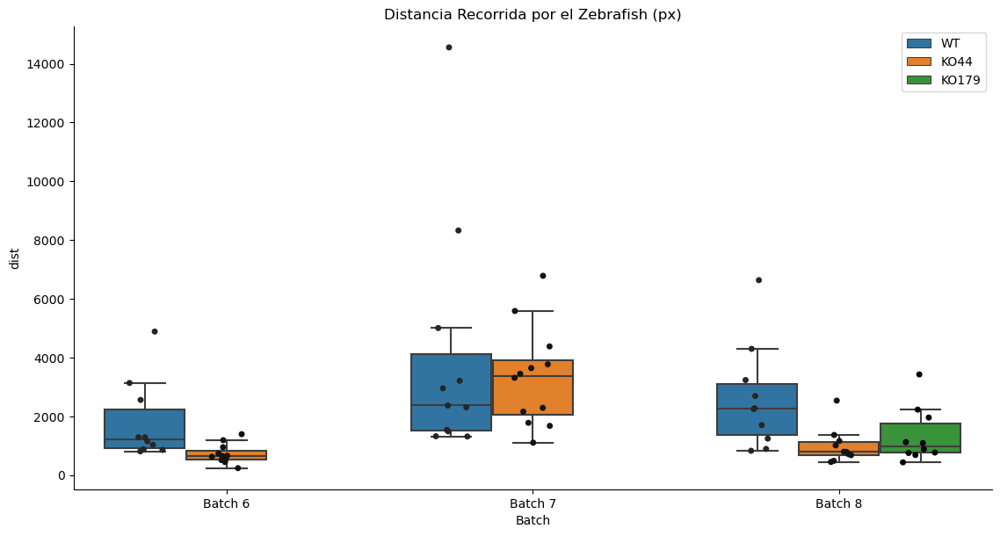

In [7]:

grped_bplot = sns.catplot(
    x="Batch",
    y="dist",
    hue="Fenotype",
    kind="box",
    showfliers=False,
    legend=False,
    height=6,
    aspect=1.9,
    data=Dist,
    hue_order = ["WT", "KO44", "KO179"]
)
# make grouped stripplot
grped_bplot = sns.stripplot(
    x="Batch",
    y="dist",
    hue="Fenotype",
    jitter=0.18,
    dodge=True,
    marker="o",
    color="black",
    # palette="Set2",
    data=Dist,
    hue_order = ["WT", "KO44", "KO179"]
)
handles, labels = grped_bplot.get_legend_handles_labels()


grped_bplot.set_title("Distancia Recorrida por el Zebrafish (px)")
plt.legend(handles[0:3], labels[0:3])
plt.show()

 
## Evolución temporal de las variables

Dado que buscamos evaluar el comportamiento de los peces, vamos a representar
las variables que hemos extraido del análisis de los videos con el tiempo.
  

El estado basal del pez se considera estirado, así, cuando el pez realiza alguna acción, se reflejara como un cambios en las variables.
Las contracciones que esperamos, se reflejaran como picos en la evolución temporal.  
  

Busco picos, por lo que las magnitudes son interesantes si presentan la linea basal baja, por lo que calculo la inversa de las que no la tienen.

In [8]:
# Inversa de algunas magnitudes
df["area_inv"] = 1 / df.area
df["Perim_inv"] = 1 / df.Perim
df["LongestShortestPath_inv"] = 1 / df.LongestShortestPath
df["Feret_inv"] = 1 / df.Feret

# df['Prueba'] = (df.Circ + df.Round)*df.Solidity # composición de varias magnitudes

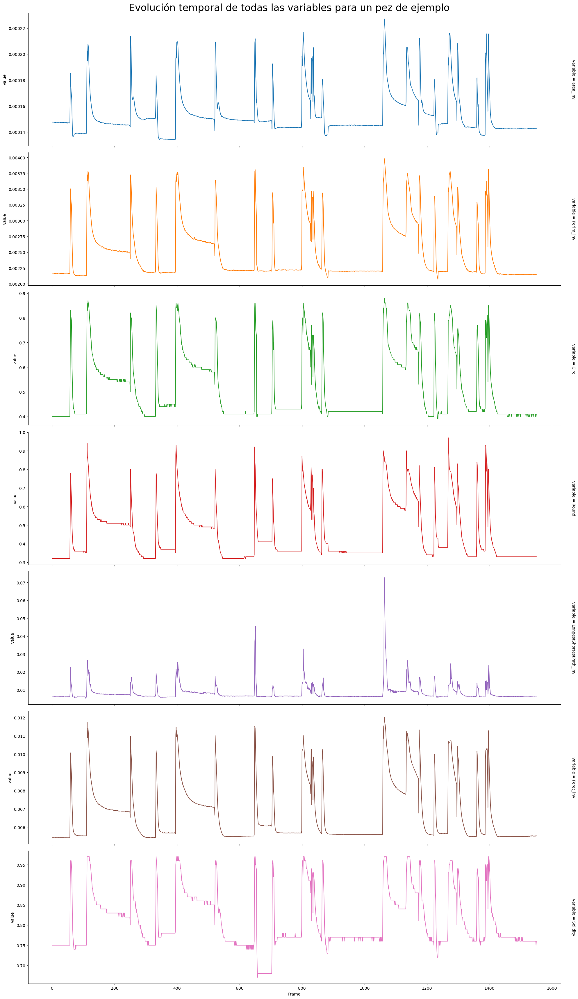

In [9]:
df_temp = df[
    (df.Batch == "Batch 7") & (df.Fenotype == "KO44") & (df.Fish == "ZebraF_1")
].melt(
    id_vars=["Frame"],
    value_vars=[
        # "area",
        "area_inv",
        # "Perim",
        "Perim_inv",
        "Circ",
        "Round",
        # "AR",
        # "LongestShortestPath",
        "LongestShortestPath_inv",
        # "Feret",
        "Feret_inv",
        # "MinFeret",
        "Solidity",
    ],
)  

g = sns.FacetGrid(
    df_temp,
    hue="variable",
    row="variable",
    sharex="col",
    sharey=False,
    height=5,
    aspect=4,
    margin_titles=True,
)
g.map(sns.lineplot, "Frame", "value")
g.set_axis_labels(fontsize=20)
g.fig.suptitle("Evolución temporal de todas las variables para un pez de ejemplo",
              fontsize=24, fontdict={"weight": "bold"})
g.fig.subplots_adjust(top=0.97)
# sns.set(font_scale=2)

plt.show()

In [10]:

#  Correlación entre variables

# sns.scatterplot(data=df[(df.Batch == "Batch 7") & (df.Fenotype == "KO44") & (df.Fish == "ZebraF_1")], x="Round", y="Solidity", hue = "Frame")
# plt.show()

# Todas las señales correlacionan altamente, esto se podrá comprobar con AFC() o con gringer 

Los picos en las señales correlacionan altamente, se ejecuta el análisis solamente sobre una única.

# Análisis

Para modelar el comportamiento del pez voy a realizar 3 aproximaciones:

## - Tiempo que pasa replegado
Dado que observamos picos, se puede evaluar el tiempo total que pasa replegado usando un threshold. 
Se asocia el tiempo total replegado a todo el tiempo que el valor esta por encima del threshold.
  
## - Contado de picos
Usando la función Peak Finder detectamos picos en las señales, que se pueden tanto contar como cuantificar con parámetros
como altura (no de interes) o anchura

## - Periodograma
Usando la FFT ver las frecuencias intrinsicas de cada uno de los peces. (puede ser interesante buscar la baseline)

# Peaks - Numero de coletazos

Contando el número de picos de las señales anteriores se evalua el número de coletazos que ejecuta el pez en el tiempo del video.
Para ello usamos la funcion peak finder sobre la magnitud que parece que muestra un mayor rango o SNR, Roundness

### Ejemplo de Peak Finder sobre un único pez

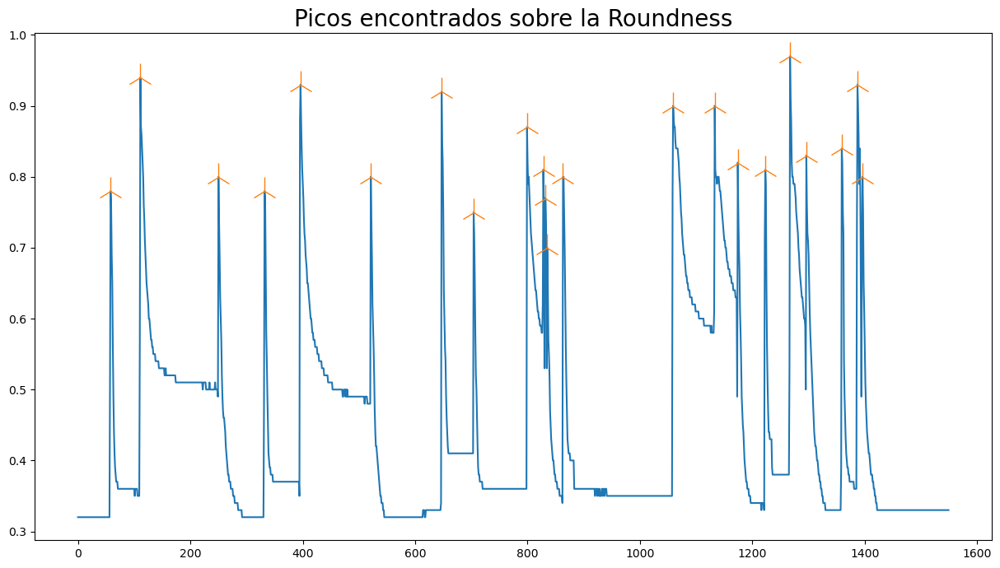

In [11]:
df_temp = df[
    (df.Batch == "Batch 7") & (df.Fenotype == "KO44") & (df.Fish == "ZebraF_1")
].Round

peaks, _ = find_peaks(
    df_temp, height=0.4, prominence=0.08, threshold=0.0, distance=2, width=1
)  # ajustar estos parametros
# he comprobado que algun gusano realiza contracciones y extensiones en 2 frames, por lo que distance = 1 & width = 1

plt.plot(df_temp)
plt.plot(peaks, df_temp[peaks], "2", markersize=24)
plt.title("Picos encontrados sobre la Roundness", size = 20)
plt.show()

Es interesante ver como funciona sobre todos los gusanos

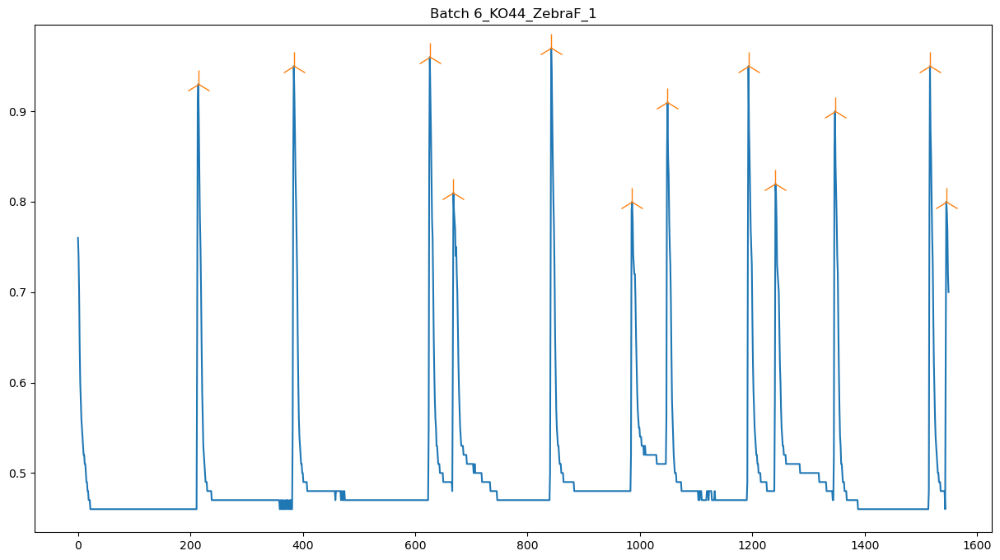

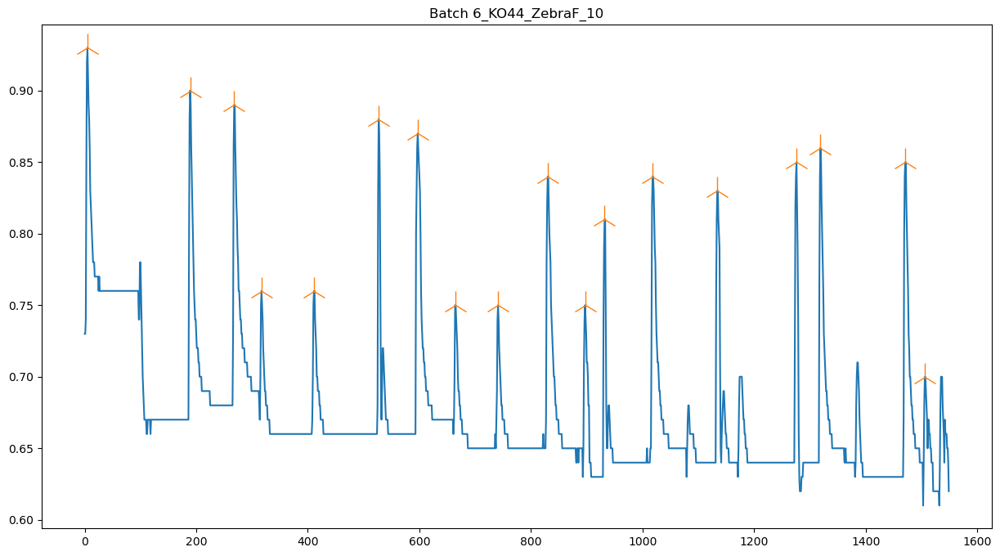

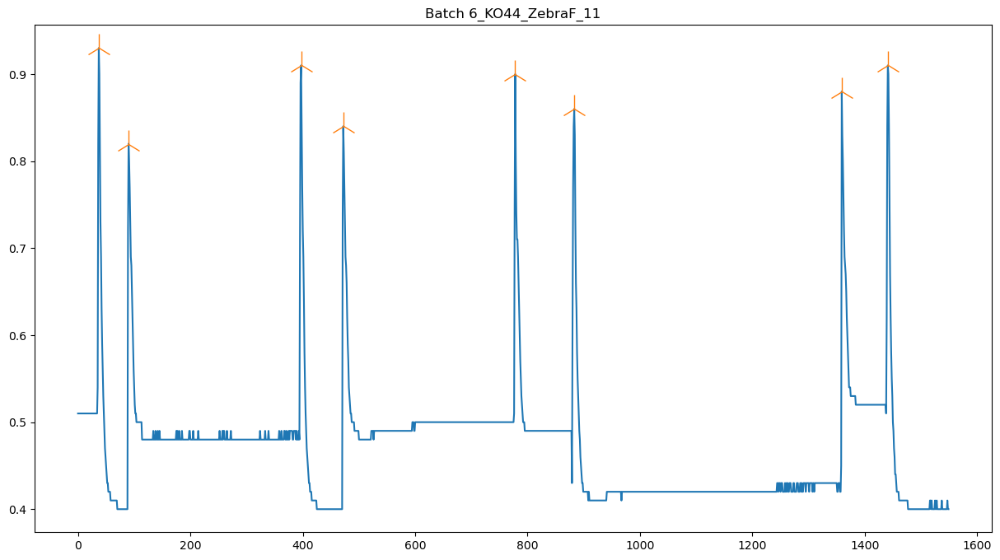

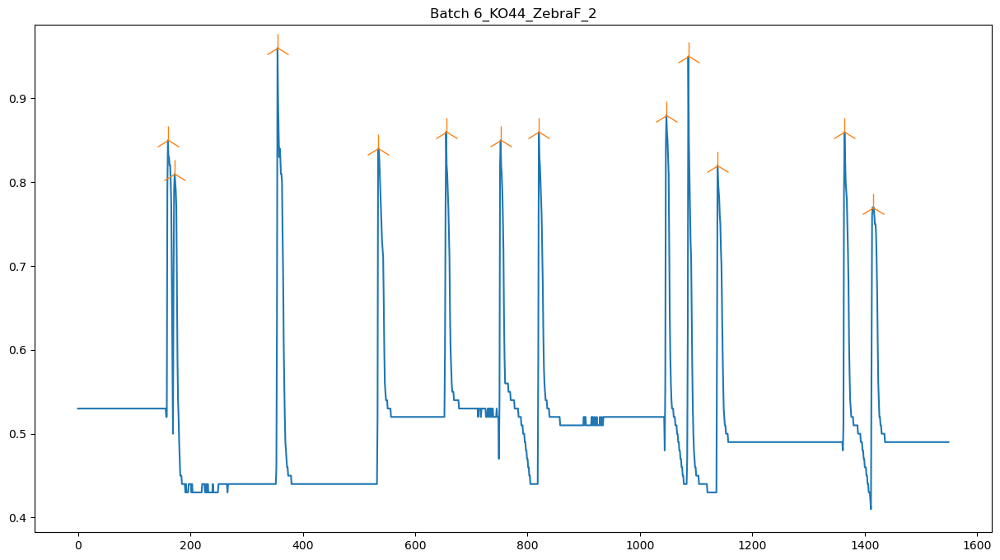

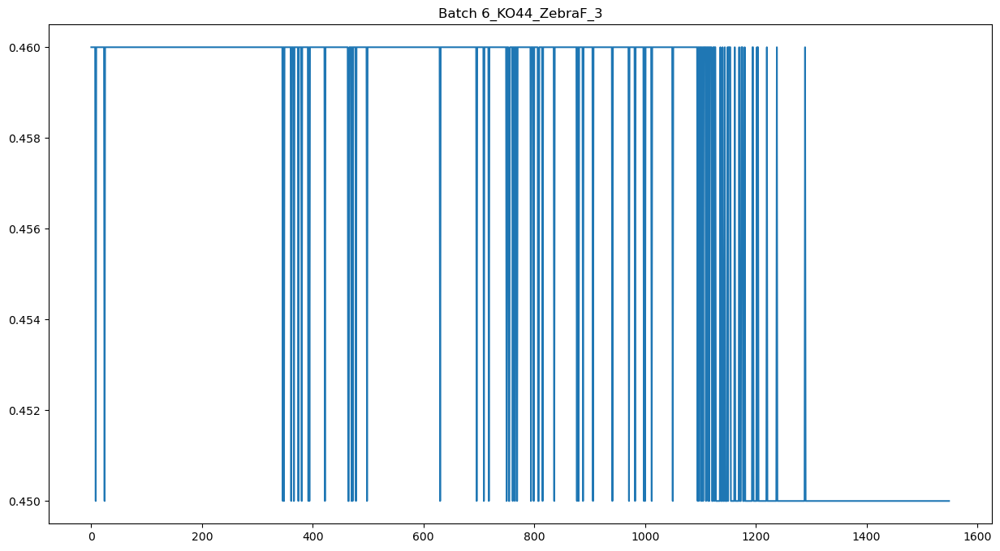

...

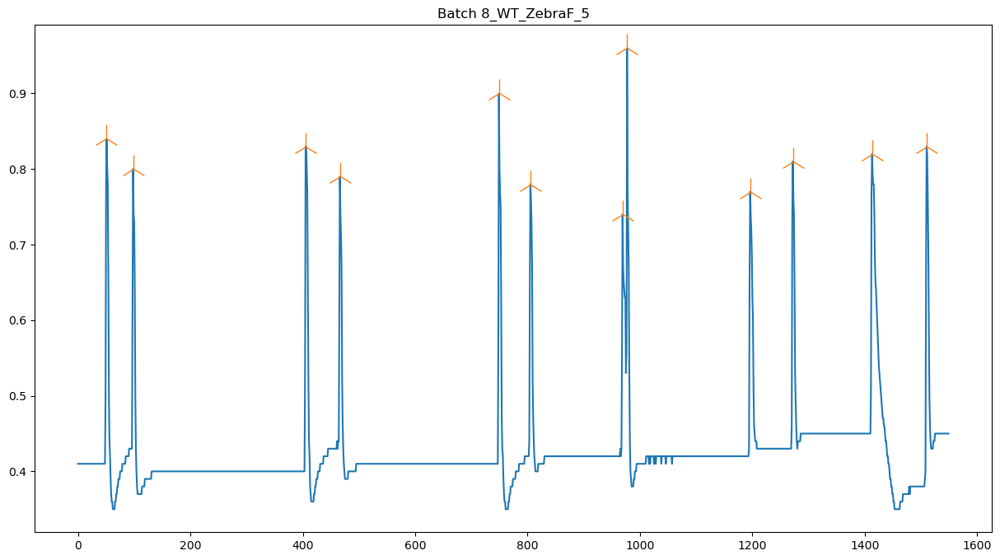

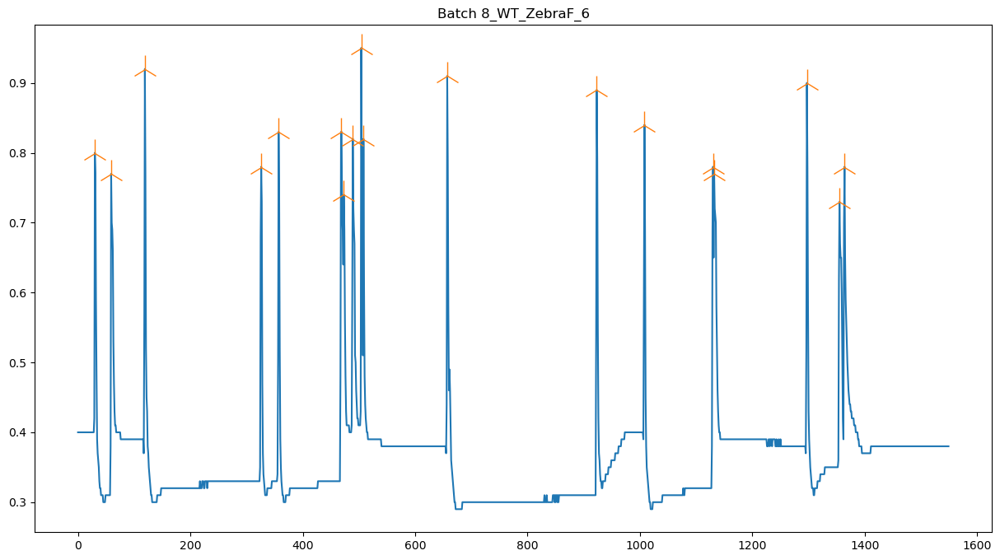

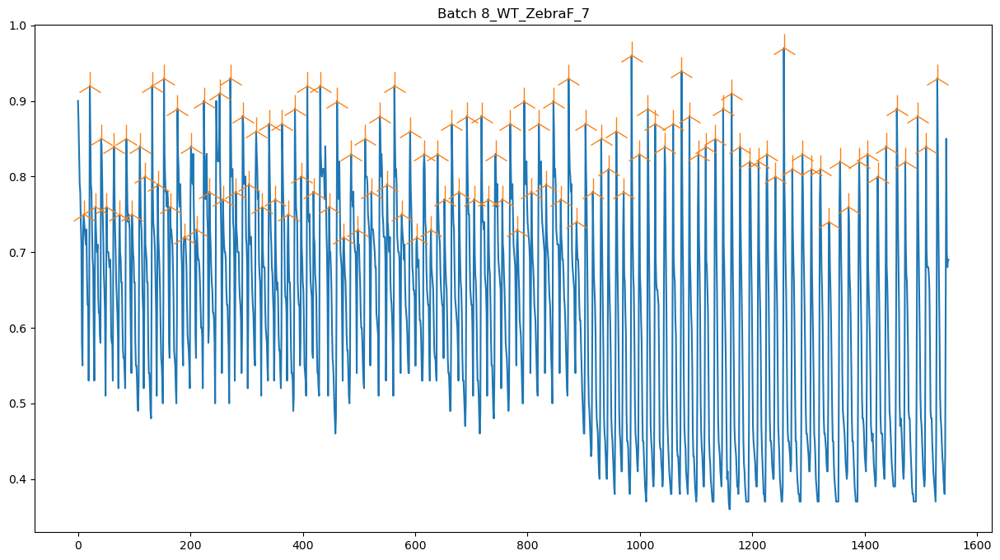

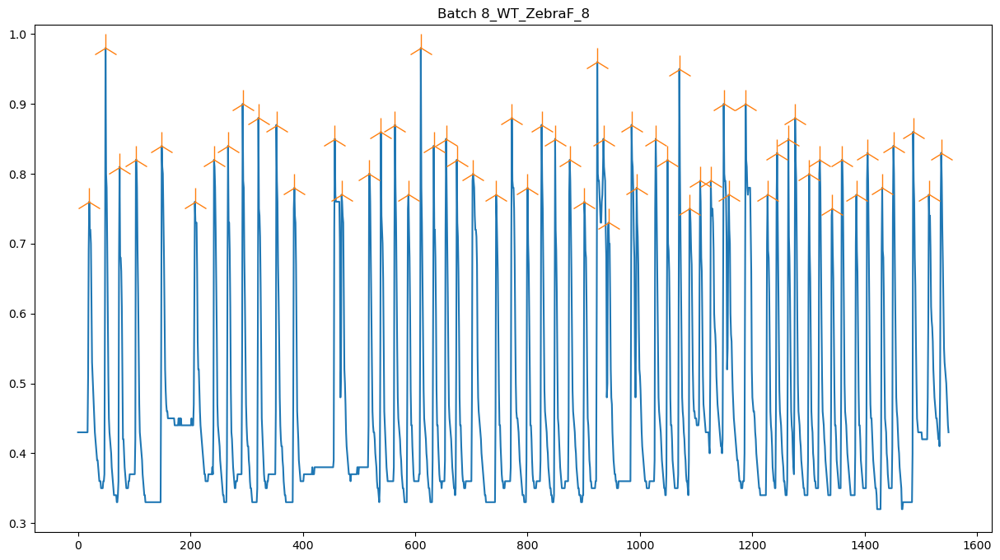

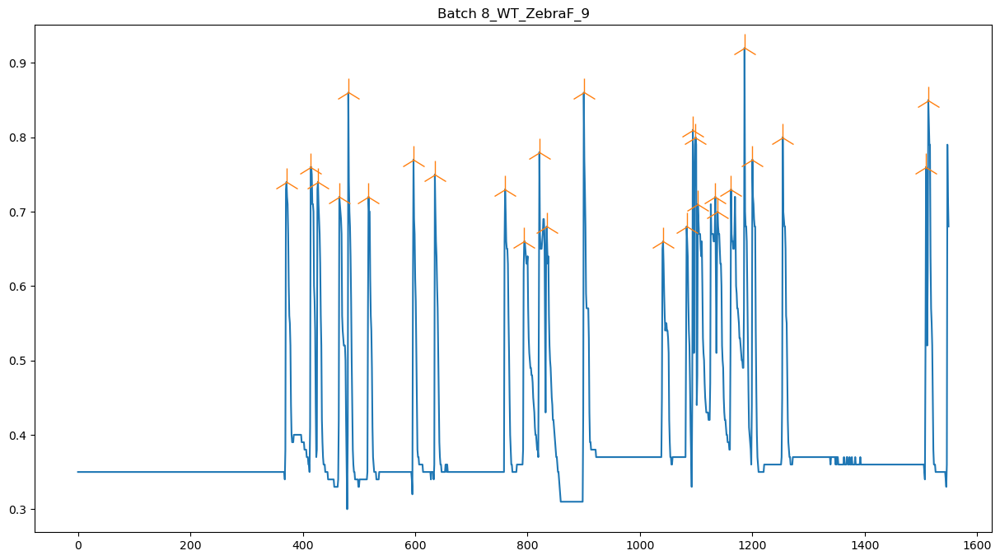

In [13]:

df["unique_fish"] = df.Batch + "_" + df.Fenotype + "_" + df.Fish

# Filtro para ver por batch
# dfa = df[df.Batch == "Batch 6"]

for f in sorted(set(df.unique_fish)):
    fish_temp = df[df.unique_fish == f].Round  # ajustar estos parametros
    peaks, _ = find_peaks(
        fish_temp, height=0.4, prominence=0.08, threshold=0.0, distance=2, width=1
    )

    plt.plot(fish_temp)
    plt.plot(peaks, fish_temp[peaks], "2", markersize=24)
    plt.title(f)
    plt.show()

In [ ]:

# Aplicar un filtro No es necesario, pues los peaks estan bien encontrados

## Número de picos por condición

Represento el número de picos por condición y batch. Dado que todos los videos duran el mismo tiempo, se puede asociar a la frecuencia.

### Circularity

Usando la circularity

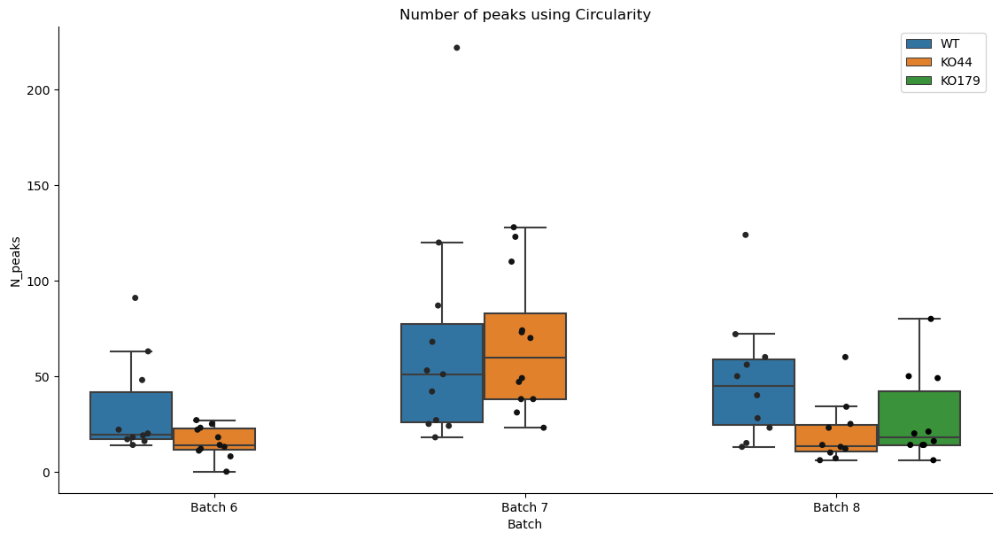

In [14]:

Variable_plot = "Circ"
peaks_df = (
    df.groupby(["Batch", "Fenotype", "Fish"])[Variable_plot]
    .apply(
        lambda x: len(
            find_peaks(
                x, height=0.4, prominence=0.08, threshold=0.0, distance=2, width=1
            )[0]
        )
    )
    .reset_index()
    .rename(columns={Variable_plot: "N_peaks"})
) 

grped_bplot = sns.catplot(
    x="Batch",
    y="N_peaks",
    hue="Fenotype",
    kind="box",
    legend=False,
    showfliers=False,
    height=6,
    aspect=1.9,
    data=peaks_df,
    hue_order = ["WT", "KO44", "KO179"]
)
# make grouped stripplot
grped_bplot = sns.stripplot(
    x="Batch",
    y="N_peaks",
    hue="Fenotype",
    jitter=0.18,
    dodge=True,
    marker="o",
    color="black",
    # palette="Set2",
    data=peaks_df,
    hue_order = ["WT", "KO44", "KO179"]
)
handles, labels = grped_bplot.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3])
grped_bplot.set_title("Number of peaks using Circularity")
plt.show()

He visualizado la gráfica anterior cambiando el valor de `height` en el intervalo 0.1-0.9 y 
no cambia hasta 0.8, el cual es ya un valor extremo para Roundness. Lo mismo con `prominence`en el 
intervalo 0.01-0,6 y es invariante hasta valores extremos a partir de 0.4 (altura del pico)

### Conclusión

El método funciona correctamente, pero hay mucha variabilidad interbatch. 
Recomiendo repasar las gráficas de los peces comparandolas con las fotos y ver que videos contienen defectos. También es necesario aumentar la N

### Batch 6 & 8

A petición de Ozrem, se gráfican conjuntamente solo los batch 6 y 8

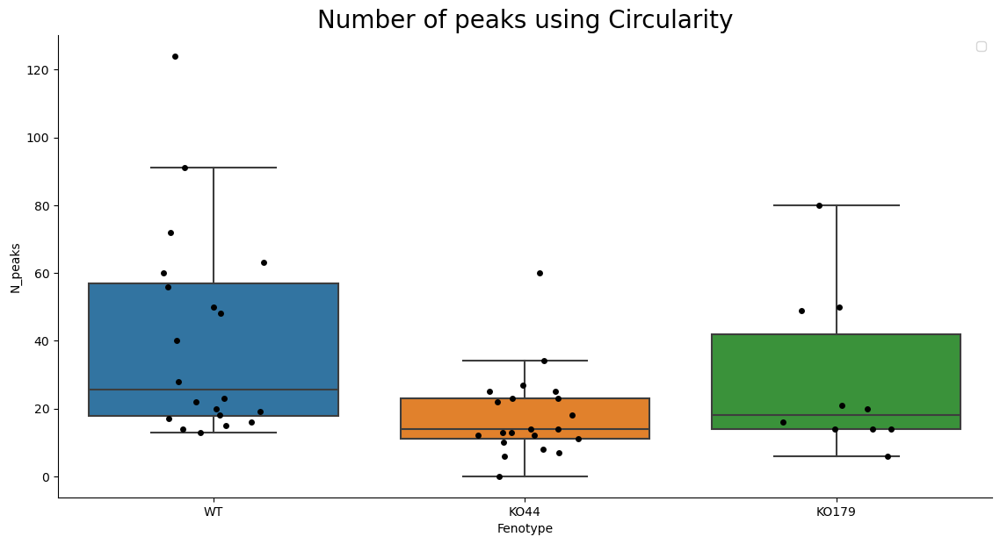

In [15]:

Variable_plot = "Circ"
peaks_df = (df[(df.Batch == "Batch 6") | (df.Batch == "Batch 8")].groupby(["Batch", "Fenotype", "Fish"])[Variable_plot]
    .apply(
        lambda x: len(
            find_peaks(
                x, height=0.4, prominence=0.08, threshold=0.0, distance=2, width=1
            )[0]
        )
    )
    .reset_index()
    .rename(columns={Variable_plot: "N_peaks"})
) 

grped_bplot = sns.catplot(
    x="Fenotype",
    y="N_peaks",
    kind="box",
    legend=False,
    showfliers=False,
    height=6,
    aspect=1.9,
    data=peaks_df,
    order = ["WT", "KO44", "KO179"]
)
# make grouped stripplot
grped_bplot = sns.stripplot(
    x="Fenotype",
    y="N_peaks",
    jitter=0.18,
    dodge=True,
    marker="o",
    color="black",
    # palette="Set2",
    data=peaks_df,
    order = ["WT", "KO44", "KO179"]
)
handles, labels = grped_bplot.get_legend_handles_labels()
l = plt.legend(handles[0:3], labels[0:3])
grped_bplot.set_title("Number of peaks using Circularity", size = 20)
plt.show()